In [1]:
import os
print(os.getcwd())
print(os.listdir())
import sys
sys.path.append('/zhome/71/c/146676/Desktop/msaca/main/')
from cil.io import TIFFStackReader
import numpy as np
import module_auxiliary as ma
import matplotlib.pyplot as plt
from cil.framework import AcquisitionGeometry, AcquisitionData, ImageGeometry, ImageData, BlockDataContainer
from cil.optimisation.functions import L2NormSquared, L1Norm, BlockFunction, MixedL21Norm, IndicatorBox, TotalVariation, LeastSquares
from cil.optimisation.operators import BlockOperator, GradientOperator, IdentityOperator, FiniteDifferenceOperator
from cil.plugins.astra.operators import ProjectionOperator
from cil.plugins.ccpi_regularisation.functions import FGP_TV
from cil.processors import CentreOfRotationCorrector
from cil.utilities.display import show_geometry
from cil.processors import RingRemover
from cil.plugins.astra import FBP
from numba import cuda
import pipeline1
import pipeline2
import pipeline3
from cil.io import NEXUSDataReader, TIFFWriter
import json
from cil.utilities.display import show2D
from cil.processors import Slicer

/zhome/71/c/146676/Desktop/msaca/main
['pipeline_test2.ipynb', 'pipeline_test (copy 1).ipynb', '__pycache__', 'pipeline_test4.ipynb', 'output.pdf.png', 'pipeline3.py', 'pipeline1.py', 'module_auxiliary.py', 'pipeline2.py', 'pipeline_test.ipynb']


In [120]:
class ExtendedData:

    
    def __init__(self, data = None, slices = None, subslices=None):
        self.data = data
        self.slices = slices
        self.subslices = subslices
        self.subdata = None
    
    def set_data(self,data):
        self.data = data
        if self.slices is None:
            self.slices = np.arange(np.shape(data)[0])

    def set_slices(self, slices):
        self.slices = slices

    def set_subslices(self,subslices):
        self.subslices = subslices
        self.subslices_indices = np.array([np.abs(self.slices - sub).argmin() for sub in self.subslices])
        

    def load_data(self,path, slices):
        paths = ma.generate_paths(path, slices)
        reader = TIFFStackReader(paths)
        self.data = reader.read()
        self.slices = slices

    def scale_data(self,scale,offset):
        self.data = self.data*scale + offset

    def acquisition_data(self, data=None, geometry=None):
        if (data is None) and (self.data is None):
            raise ValueError("Load data using .add_data(data) method, or by supplying it here")
        if (data is not None) and (self.data is not None):
            raise ValueError("Data has already been supplied. Overwrite it")
        if geometry is None:
            raise ValueError("Please supply Acquisition geometry")
        
        if (data is not None) and (self.data is None):
            self.data = AcquisitionData(data, geometry=geometry)
            if self.subslices is not None:
                self.set_subslices(subslices = self.slices)
                

        if (data is None) and (self.data is not None):
            self.data = AcquisitionData(self.data, geometry=geometry)



    def pad_edges(self):
        if self.slices is None:
            raise ValueError("Supply slices using add_slices")
        if isinstance(self.data, np.ndarray):
            mask, indices, data = ma.determine_edge2(self.data,bias = 15,slices=self.slices)
            self.data = ma.gaussian_padding(self.data,indices, sigma = 30, cutoff=4, pad_mean_window_size = 50)

        # Does not work ATM
        #if type(self.data) is AcquisitionData:
        #    data = self.data.as_array()
        #    mask, indices, data = ma.determine_edge2(data,bias = 15,slices=self.slices)
        #    data = ma.gaussian_padding(data,indices, sigma = 30, cutoff=4, pad_mean_window_size = 50)
        #    self.data.fill(data)

    def set_rotation_axis(self, position = [0,0,0], rotation = [0,0,1]):
        self.data.geometry.config.system.rotation_axis.direction = rotation
        self.data.geometry.config.system.rotation_axis.position = position

    def set_subdata(self,subslices = None):
        self.set_subslices(subslices=subslices)
        skip = self.subslices_indices[1] - self.subslices_indices[0]

        roi = {'vertical':(self.subslices_indices[0], self.subslices_indices[-1] + skip,skip)}
        processor = Slicer(roi)
        processor.set_input(self.data)
        self.subdata = processor.get_output()
        self.subdata.geometry.config.system.detector.position[2] = 0

    def remove_ring(self,subdata = False):
        if not subdata:
            ringrmv = RingRemover(decNum=4, wname='db5', sigma=0.1, info=True)
            ringrmv.set_input(self.data)
            self.data = ringrmv.get_output()
        else:
            if self.subdata is None:
                raise ValueError('Specify subdata using .set_subdata()')
            ringrmv = RingRemover(decNum=4, wname='db5', sigma=0.1, info=True)
            ringrmv.set_input(self.subdata)
            self.subdata = ringrmv.get_output()

    def fbp(self, subdata = False):

        if not cuda.is_available():
            raise ValueError("GPU is not available.")
        
        if subdata:
            print(np.shape(self.subdata.as_array()))
            ig = self.subdata.geometry.get_ImageGeometry(resolution=1)
            self.subdata.reorder('astra')
            device = 'gpu'
            fbp = FBP(ig,self.subdata.geometry,device)
            reconstruction = fbp(self.subdata)
        else:
            ig = self.data.geometry.get_ImageGeometry(resolution=1)
            self.data.reorder('astra')
            device = 'gpu'
            fbp = FBP(ig,self.data.geometry,device)
            reconstruction = fbp(self.data)

        return reconstruction
    
    def xcor_offset(self,slice_index, ang_tol = 0.2,n_projs = 10):
        projection_indices = np.arange(0,360, step=360//n_projs).astype(int)
        offsets = np.empty(len(projection_indices))
        for projection_index, iter in zip(projection_indices,range(len(projection_indices))):
            processor = CentreOfRotationCorrector.xcorrelation(slice_index,projection_index=int(projection_index),ang_tol=ang_tol)
            processor.set_input(self.subdata)
            temp = processor.get_output()
            offsets[iter] = temp.geometry.config.system.rotation_axis.position[0]
        return np.mean(offsets)

    def calculate_cor_axis(self,n_projs = 10):
        offsets = np.empty(len(self.subslices_indices))
        for iter in  range(len(self.subslices_indices)):
            offsets[iter] = self.xcor_offset(slice_index = iter, ang_tol = 0.2,n_projs = n_projs)
        
        return offsets

    def correct_axis(self, n_projs = 10):
        offsets = self.calculate_cor_axis(n_projs = n_projs)
        fit = np.polyfit(self.subslices, offsets,deg=1)
        return [fit[0], 0.0, 1], [fit[1], 0, 0.0]


In [121]:
skip = 10
slices = np.arange(100, 1006, skip)
path = '/work3/msaca/Mars_data_1/02_sinogramdata/sinograms/ABC_2/sinocleaned_#####.tif'

angles = None
N_pixels = 1698
N_slices = len(slices)
if angles is None:
    angles = np.linspace(0, 360, 1126, endpoint=True, dtype=np.float32)
    
ag = AcquisitionGeometry.create_Parallel3D(detector_position=[0,N_pixels//2,0])\
                            .set_angles(angles)\
                            .set_panel((N_pixels,N_slices), pixel_size=(1,1))\
                            .set_labels(labels=('vertical','angle','horizontal'))

sinograms = ExtendedData()
sinograms.load_data(path = path, slices = slices)
sinograms.scale_data(scale=1/2500,offset=-12)
sinograms.pad_edges()

sinograms.acquisition_data(geometry=ag)
subslices = slices[2:-1:10]
sinograms.set_subdata(subslices=subslices)

offsets = sinograms.calculate_cor_axis(n_projs = 10)

cor_subslices = sinograms.subslices
cor_subslices_indices = sinograms.subslices_indices

ROI for axis vertical has 'stop' out of bounds. Using axis length as stop value. Got stop index: 92, using 91


In [122]:
print(offsets)
print(sinograms.slices)
print(sinograms.subslices)
print(sinograms.subslices_indices)

[17.171 16.767 16.889 15.856 16.731 15.495 15.742 14.843 13.344]
[ 100  110  120  130  140  150  160  170  180  190  200  210  220  230
  240  250  260  270  280  290  300  310  320  330  340  350  360  370
  380  390  400  410  420  430  440  450  460  470  480  490  500  510
  520  530  540  550  560  570  580  590  600  610  620  630  640  650
  660  670  680  690  700  710  720  730  740  750  760  770  780  790
  800  810  820  830  840  850  860  870  880  890  900  910  920  930
  940  950  960  970  980  990 1000]
[120 220 320 420 520 620 720 820 920]
[ 2 12 22 32 42 52 62 72 82]


In [123]:
## Batch reconstruction Method B reconstruction
N_batches = len(cor_subslices)
recon_total = np.empty((len(sinograms.slices),N_pixels, N_pixels),np.float64)
mid_points = (cor_subslices_indices[:-1] + cor_subslices_indices[1:])//2
batch_intervals = np.zeros((2,len(cor_subslices)), int)
batch_intervals[0,1:] = mid_points
batch_intervals[1,:-1] = mid_points
batch_intervals[1,-1] = len(sinograms.slices)-1

for i_batch in range(N_batches):

    sinograms.set_rotation_axis(position = [offsets[i_batch] - 4*(i_batch==4),0,0])

    interval_start = batch_intervals[0,i_batch]
    interval_end = batch_intervals[1,i_batch]

    print('interval_start', interval_start)
    print('interval_end', interval_end)


    subslices = sinograms.slices[interval_start:interval_end]
    print(len(subslices))
    sinograms.set_subdata(subslices=subslices)
    sinograms.remove_ring(subdata = True)
    recon = sinograms.fbp(subdata=True)
    recon_total[interval_start : interval_end] = recon.as_array()



interval_start 0
interval_end 7
7
Finish Ring Remover
(7, 1126, 1698)
interval_start 7
interval_end 17
10
Finish Ring Remover
(10, 1126, 1698)
interval_start 17
interval_end 27
10
Finish Ring Remover
(10, 1126, 1698)
interval_start 27
interval_end 37
10
Finish Ring Remover
(10, 1126, 1698)
interval_start 37
interval_end 47
10
Finish Ring Remover
(10, 1126, 1698)
interval_start 47
interval_end 57
10
Finish Ring Remover
(10, 1126, 1698)
interval_start 57
interval_end 67
10
Finish Ring Remover
(10, 1126, 1698)
interval_start 67
interval_end 77
10
Finish Ring Remover
(10, 1126, 1698)
interval_start 77
interval_end 90
13
Finish Ring Remover
(13, 1126, 1698)


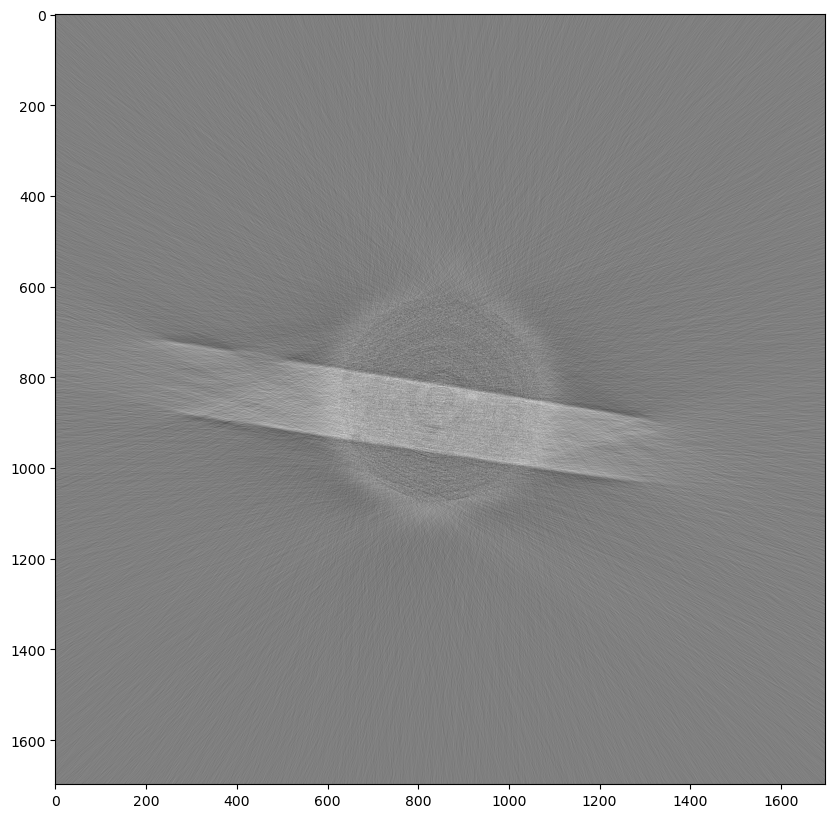

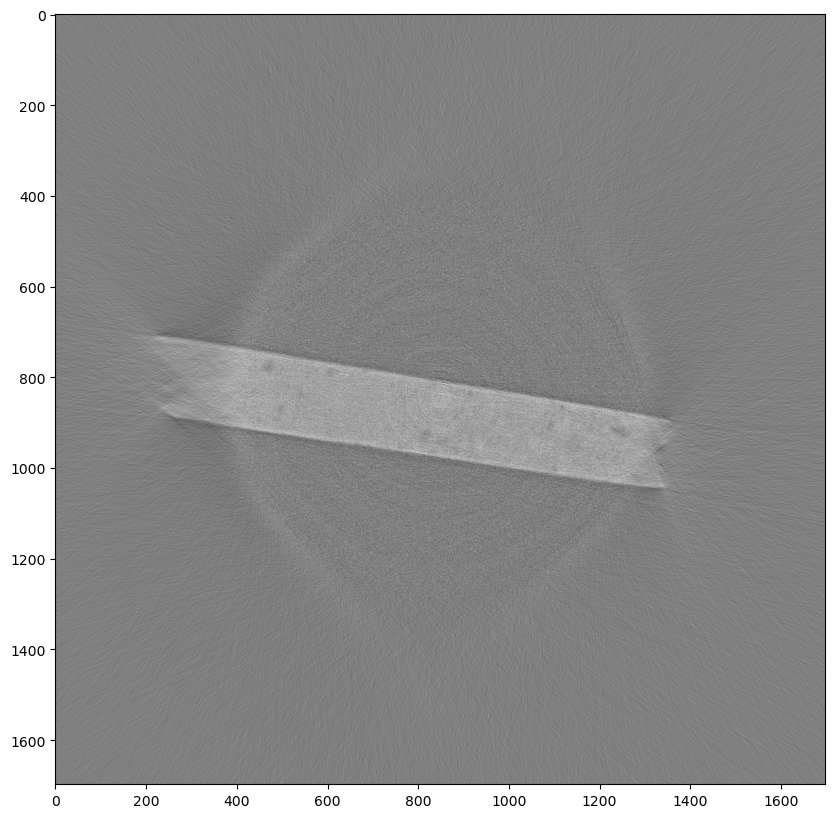

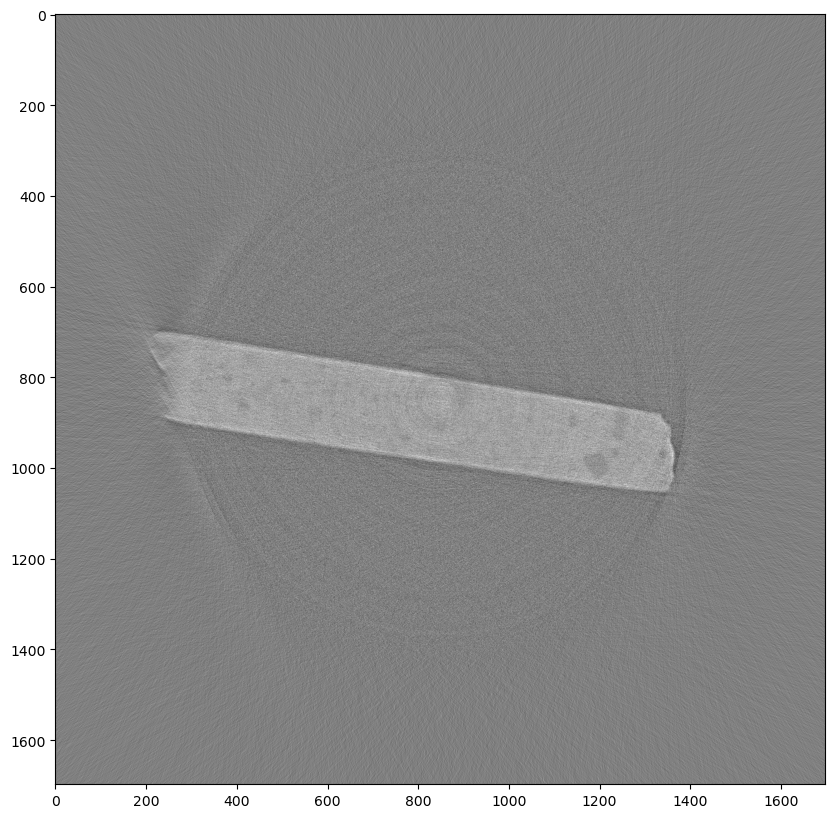

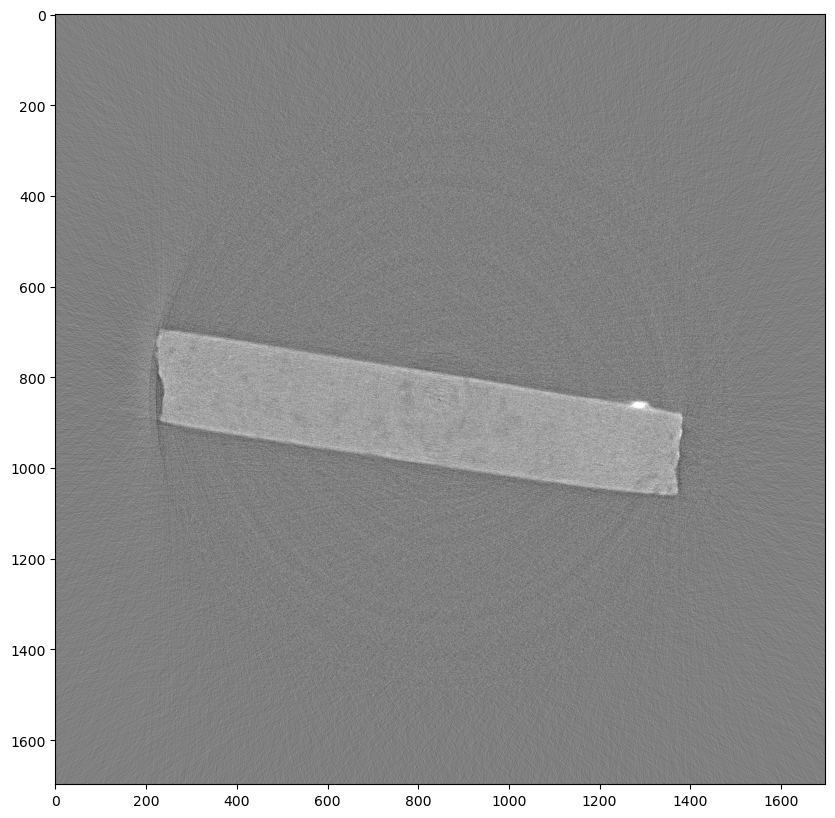

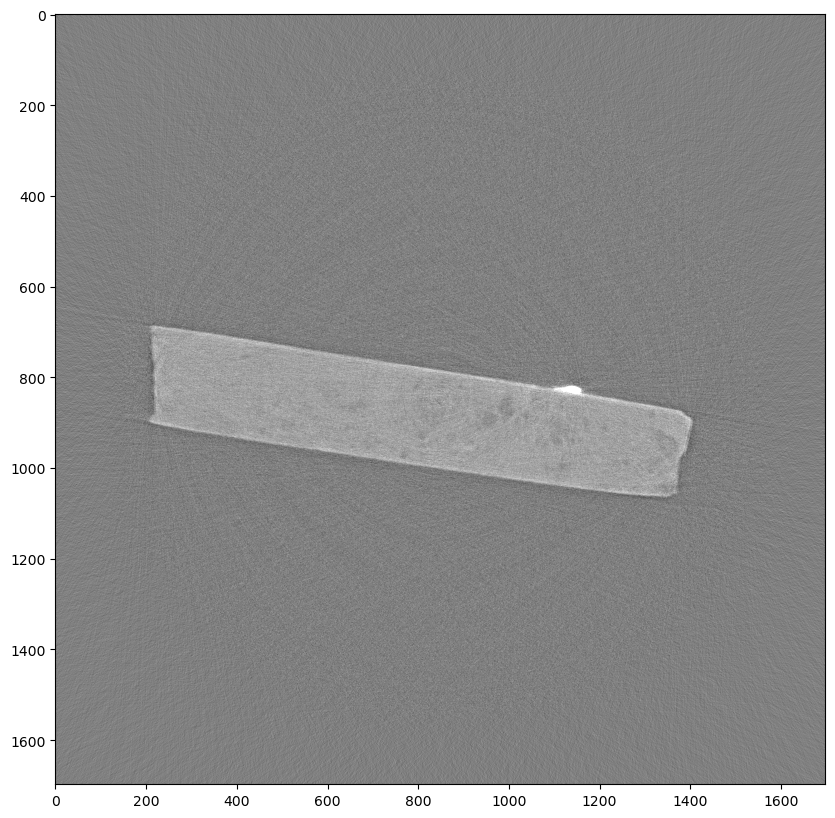

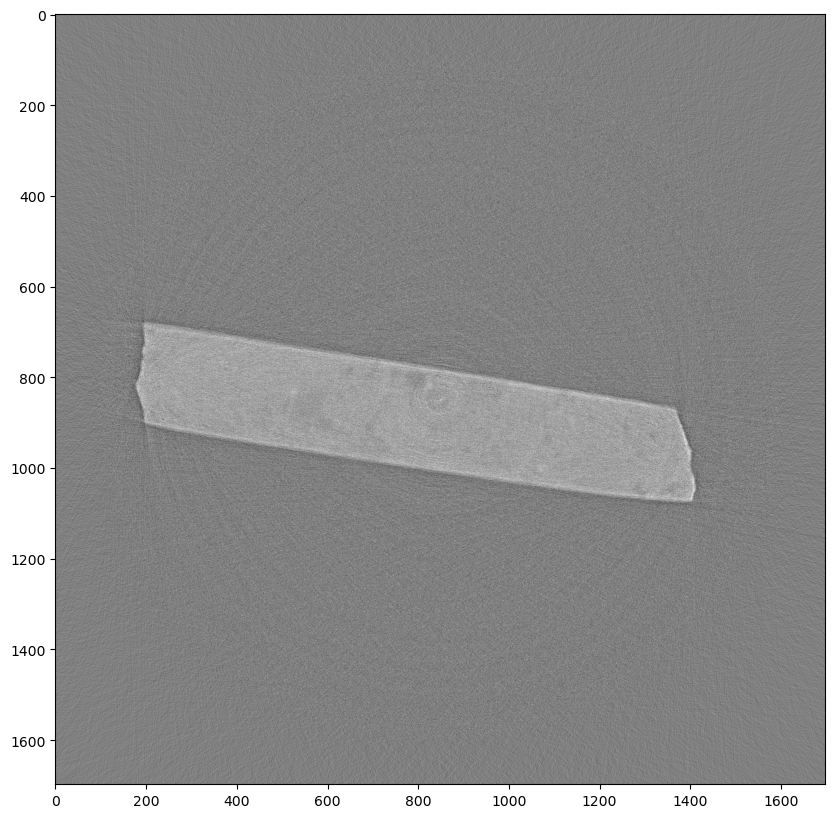

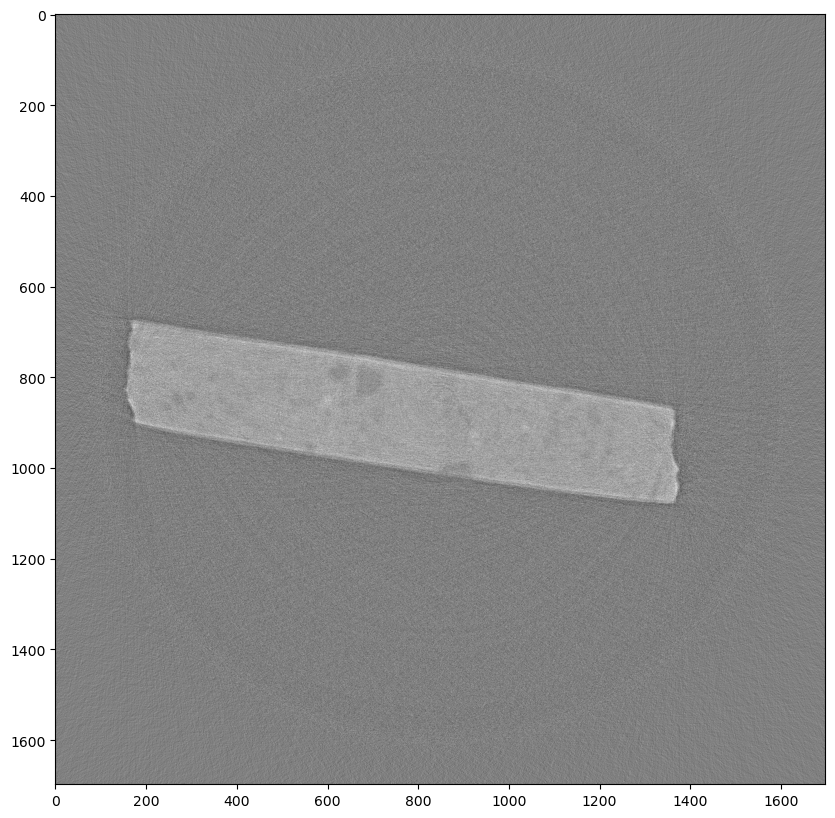

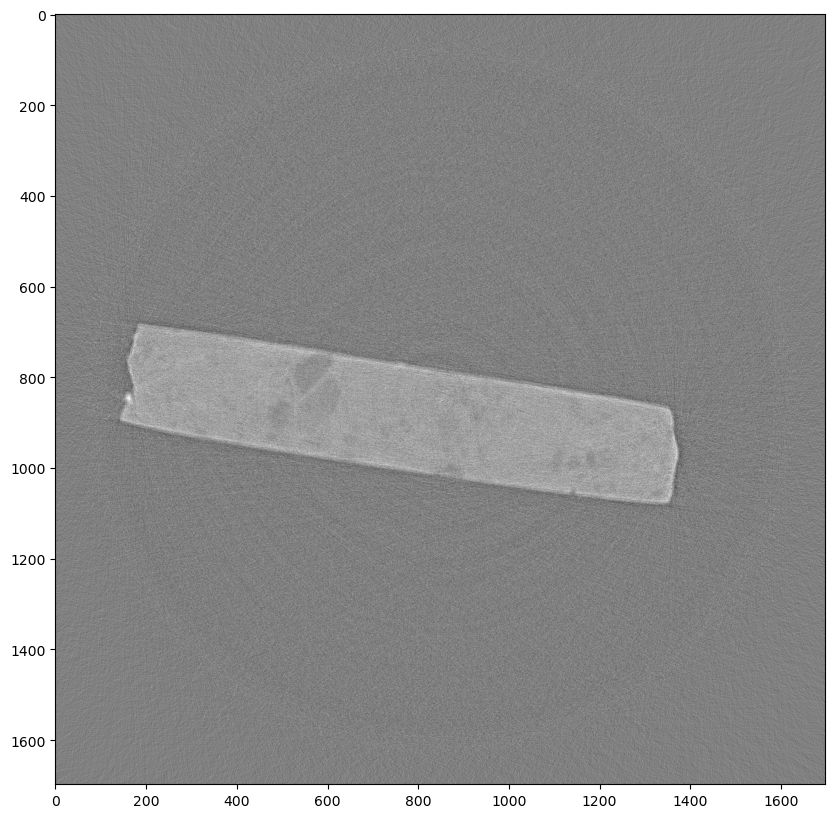

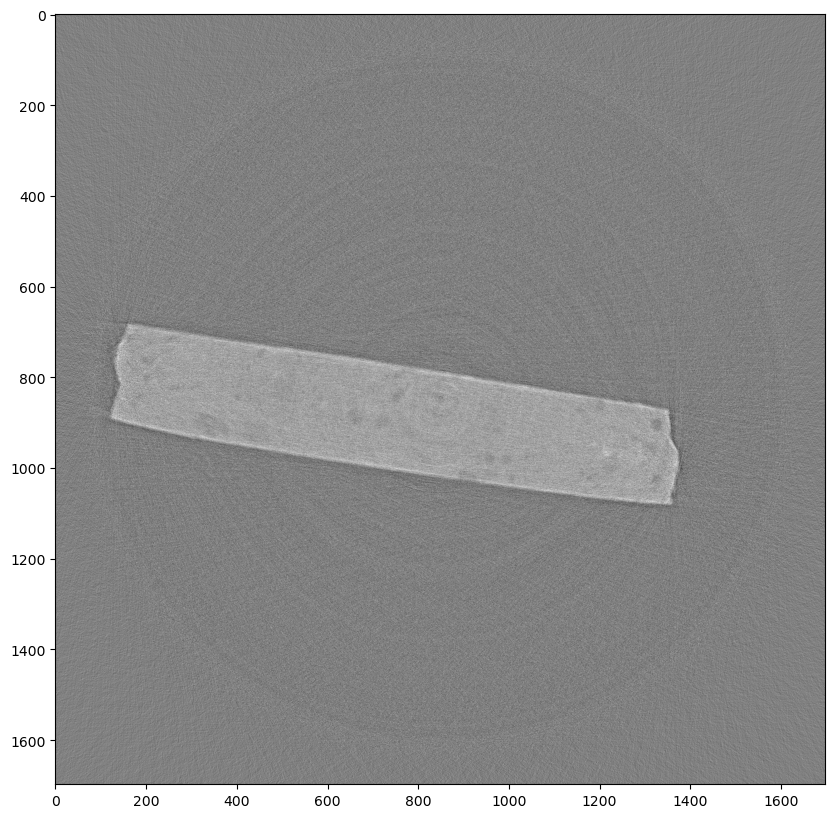

In [124]:
for i in range(9):
    plt.figure(figsize=(10,10))
    plt.imshow(recon_total[10*i,:,:], cmap='gray')
    plt.clim([-0.001,0.001])
    plt.show()

In [ ]:
## Method A CoR correction and reconstruction:
skip = 1
slices = np.arange(100, 1006, skip)
path = '/work3/msaca/Mars_data_1/02_sinogramdata/sinograms/ABC_2/sinocleaned_#####.tif'

angles = None
N_pixels = 1698
N_slices = len(slices)
if angles is None:
    angles = np.linspace(0, 360, 1126, endpoint=True, dtype=np.float32)
    
ag = AcquisitionGeometry.create_Parallel3D(detector_position=[0,N_pixels//2,0])\
                            .set_angles(angles)\
                            .set_panel((N_pixels,N_slices), pixel_size=(1,1))\
                            .set_labels(labels=('vertical','angle','horizontal'))

sinograms = ExtendedData()
sinograms.load_data(path = path, slices = slices)
sinograms.scale_data(scale=1/2500,offset=-12)
sinograms.pad_edges()

sinograms.acquisition_data(geometry=ag)

sinograms.set_rotation_axis(position = [0,0,0], rotation = [0,0,1])
subslices = slices[2:-1:100]
sinograms.set_subdata(subslices=subslices)


In [ ]:

rotation, position = sinograms.correct_axis(n_projs = 10)
sinograms.set_rotation_axis(position = position, rotation = rotation)
sinograms.remove_ring(subdata = False)
recon = sinograms.fbp(subdata=False)

In [130]:
print(rotation, position)

[-0.003955833333333319, 0.0, 1] [17.927922222222204, 0, 0.0]


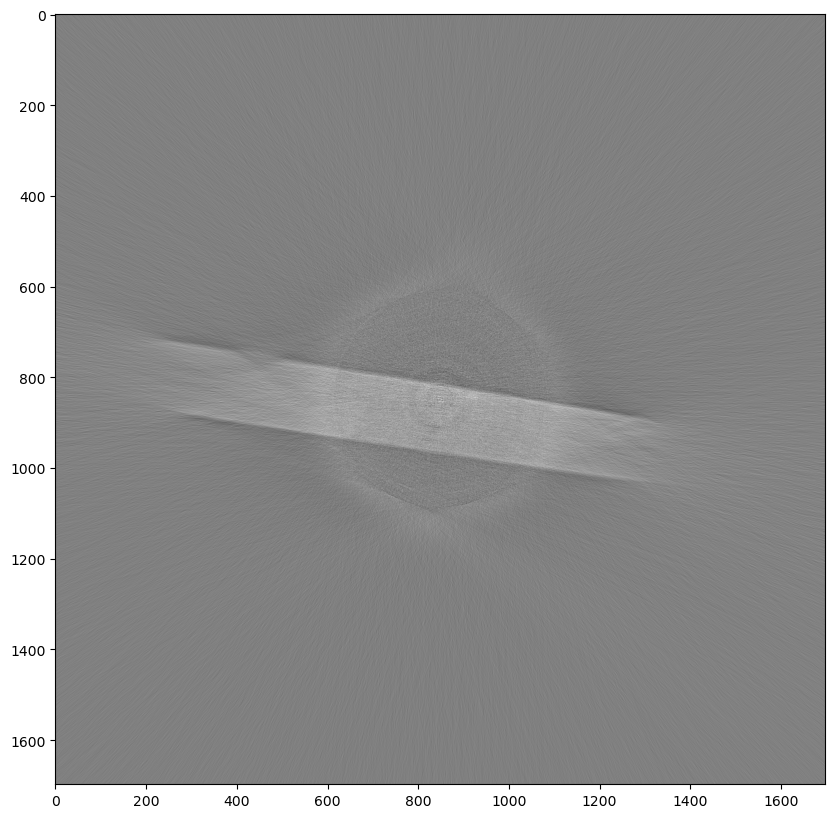

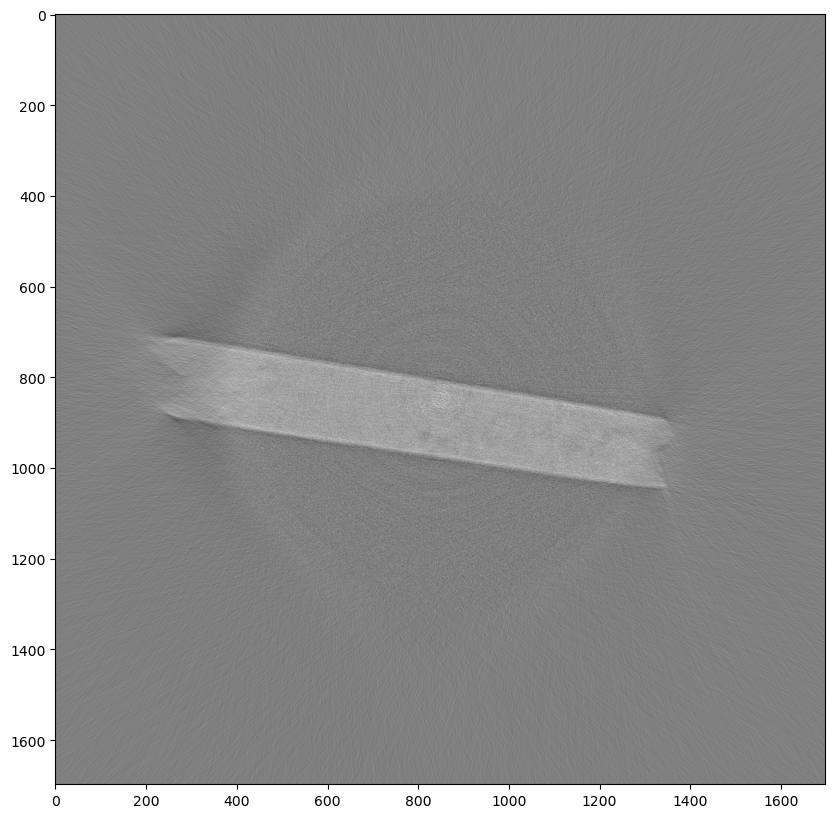

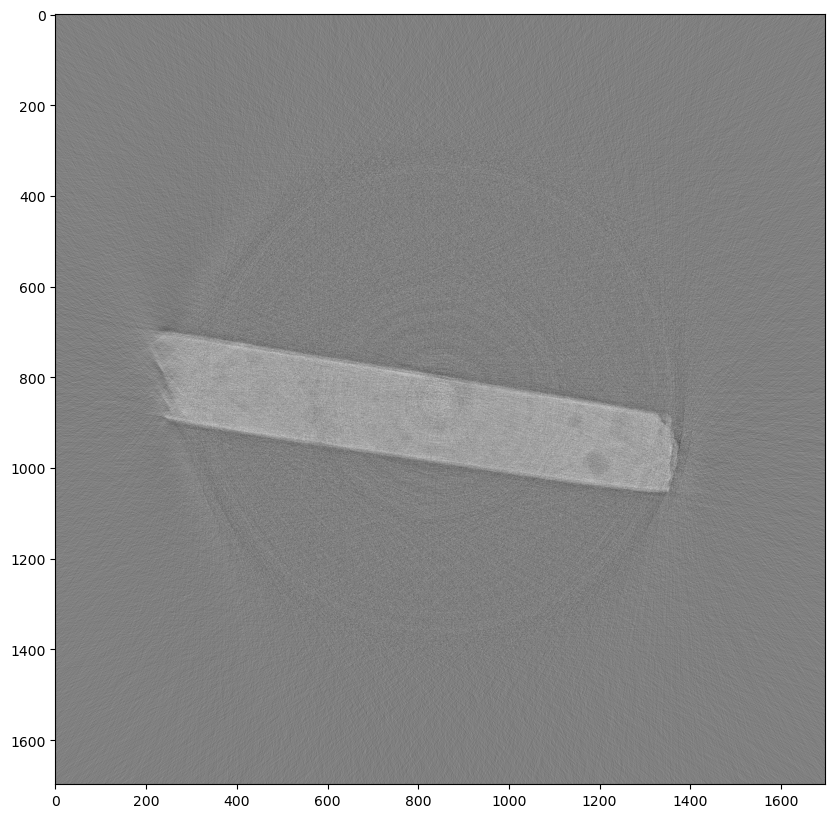

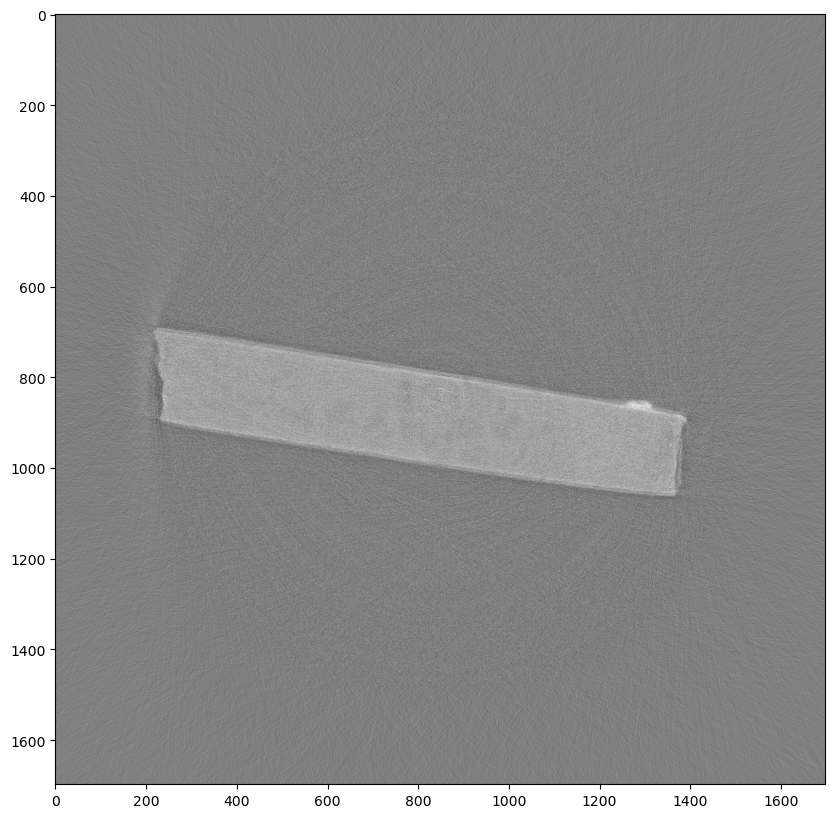

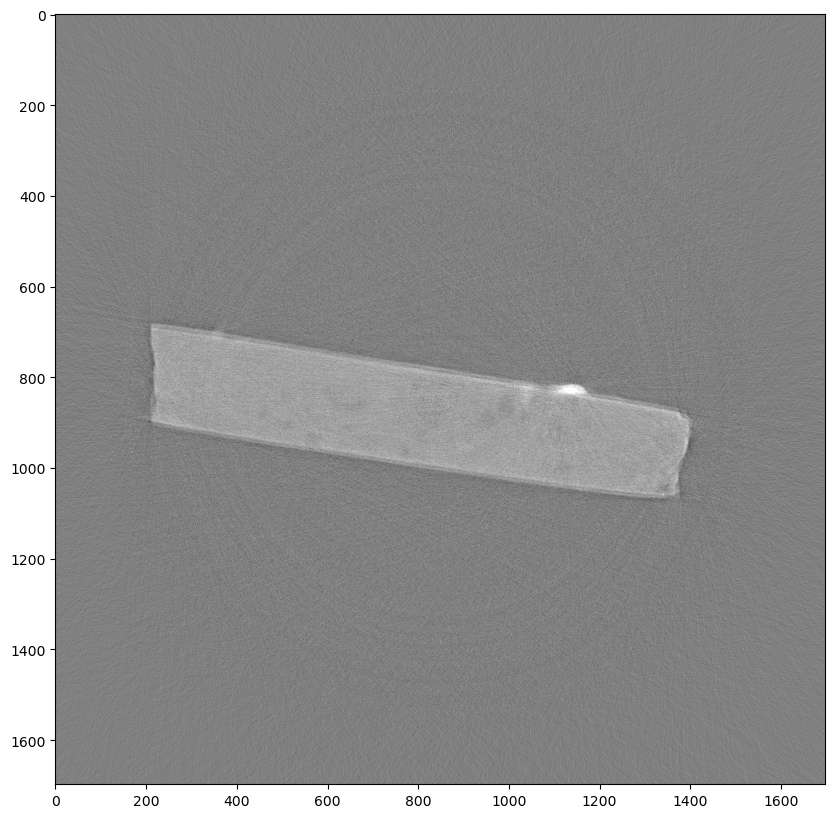

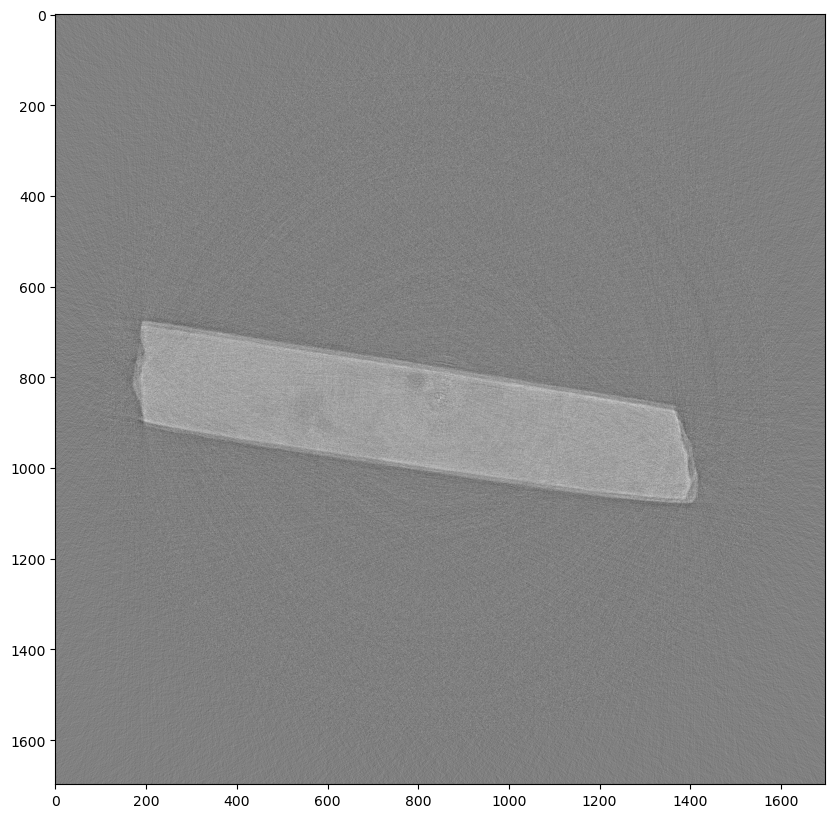

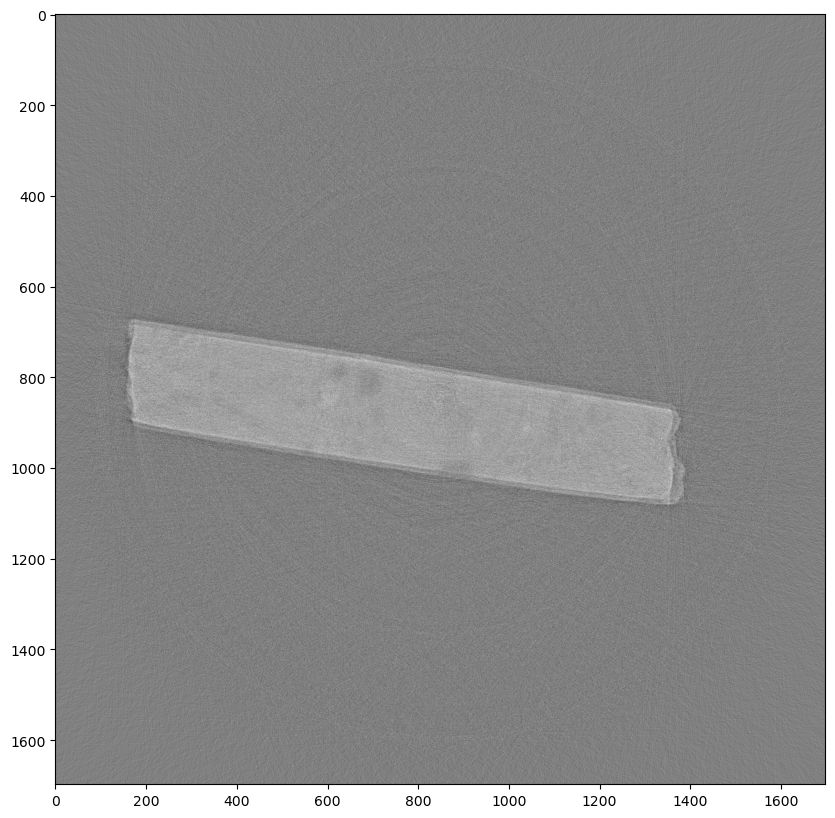

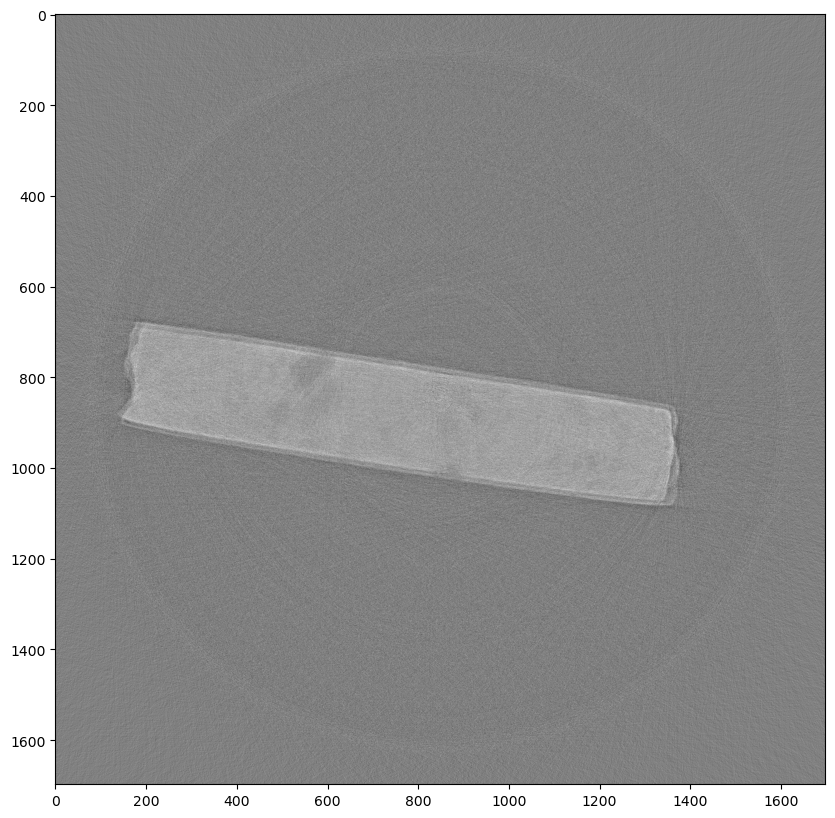

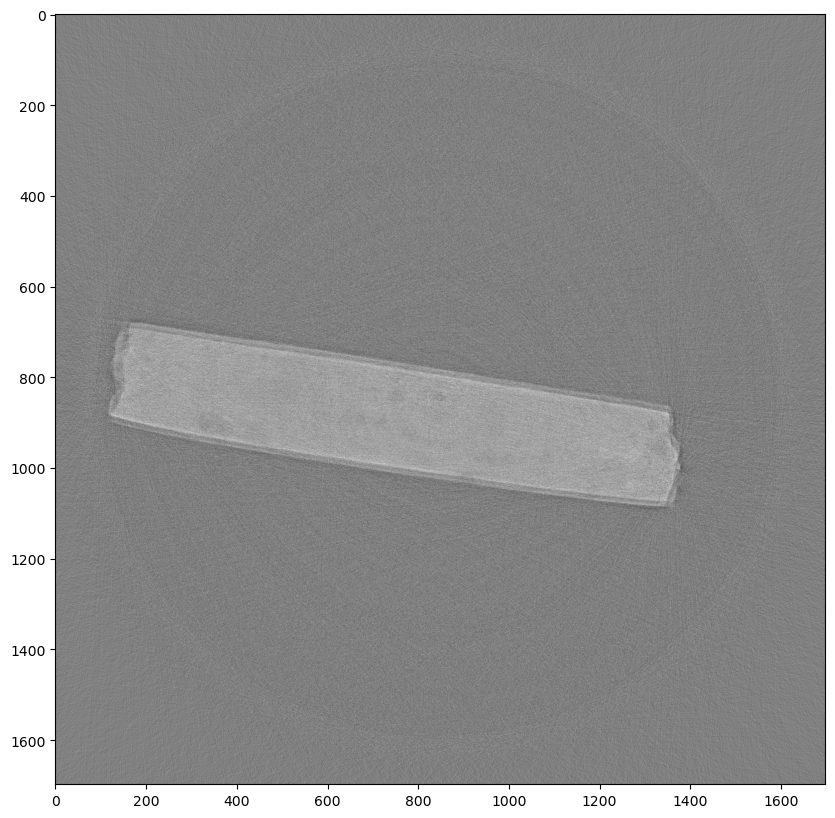

In [ ]:
for i in range(9):
    plt.figure(figsize=(10,10))
    plt.imshow(recon.as_array()[100*i,:,:], cmap='gray')
    plt.clim([-0.001,0.001])
    plt.show()

In [ ]:
angles = None
skip = 10
slices = list(range(100, 100+skip*25, skip))
path = '/work3/msaca/Mars_data_1/02_sinogramdata/sinograms/ABC_2/sinocleaned_#####.tif'
paths = ma.generate_paths(path, slices)
reader = TIFFStackReader(paths)
sinograms = reader.read()
sinograms = (sinograms/2500-12)
sinograms = sinograms[np.newaxis] if len(np.shape(sinograms)) == 2 else sinograms  # Add a dimension, if slice is only single slice

N_pixels = np.shape(sinograms)[2]
N_slices = len(slices)
if angles is None:
    angles = np.linspace(0, 360, np.shape(sinograms)[1], endpoint=True, dtype=np.float32)
    
ag = AcquisitionGeometry.create_Parallel3D(detector_position=[0,N_pixels//2+10,0])\
                            .set_angles(angles)\
                            .set_panel((N_pixels,N_slices), pixel_size=(1,1))\
                            .set_labels(labels=('vertical','angle','horizontal'))


sinograms = AcquisitionData(sinograms, geometry=ag)
ig = ag.get_ImageGeometry(resolution=1)

if not cuda.is_available():
    raise ValueError("GPU is not available.")
else:
    ag = sinograms.geometry
    device='gpu'
    
    initial = ig.allocate(0)


sinograms.reorder('astra')
device = 'gpu'
fbp = FBP(ig,ag,device)
reconstruction = fbp(sinograms)

print(sinograms)
print(ag)
print(ig)
print(np.max(reconstruction))

In [ ]:

## Load data and correct for CoR
angles = None
skip = 1
slices = list(range(100, 1006, skip))
path = '/work3/msaca/Mars_data_1/02_sinogramdata/sinograms/ABC_2/sinocleaned_#####.tif'
paths = ma.generate_paths(path, slices)
reader = TIFFStackReader(paths)
sinograms = reader.read()
sinograms = (sinograms/2500-12)
sinograms = sinograms[np.newaxis] if len(np.shape(sinograms)) == 2 else sinograms  # Add a dimension, if slice is only single slice

mask, indices, data = ma.determine_edge2(sinograms,bias = 15,slices=slices)
sinograms = ma.gaussian_padding(sinograms,indices, sigma = 30, cutoff=4, pad_mean_window_size = 50)
                #    if isinstance(other_args, dict) and 'reconstruction_slices' in other_args:
                #        reconstruction_slices = other_args['reconstruction_slices']
                #        indices = [i for i, element in enumerate(slices) if element in reconstruction_slices]
                #        sinograms = sinograms[indices]
                #        slices = reconstruction_slices

# Define geometry
N_pixels = np.shape(sinograms)[2]
N_slices = len(slices)
if angles is None:
    angles = np.linspace(0, 360, np.shape(sinograms)[1], endpoint=True, dtype=np.float32)
    
ag = AcquisitionGeometry.create_Parallel3D(detector_position=[0,N_pixels//2+10,0])\
                            .set_angles(angles)\
                            .set_panel((N_pixels,N_slices), pixel_size=(1,1))\
                            .set_labels(labels=('vertical','angle','horizontal'))
sinograms = AcquisitionData(sinograms, geometry=ag)
ig = ag.get_ImageGeometry(resolution=1)

# Center of rotatoin corrector
target_slices = slices[2:-2]
#tilt, pos = correct_axis(sinograms,slices,target_slices,n_projs = 10)
sinograms.geometry.config.system.rotation_axis.direction = [-0.005354254385964904, 0.0, 1]
sinograms.geometry.config.system.rotation_axis.position = [18.322823684210523, 0, 0.0]
print(sinograms.geometry.config.system.rotation_axis.direction, sinograms.geometry.config.system.rotation_axis.position)

# Ring removal corrector
ringrmv = RingRemover(decNum=4, wname='db5', sigma=0.1, info=True)
ringrmv.set_input(sinograms)
sinograms = ringrmv.get_output()


# FBP Reconstructor. Check if GPU is available
if not cuda.is_available():
    raise ValueError("GPU is not available.")
else:
    ag = sinograms.geometry
    device='gpu'
    
    initial = ig.allocate(0)


sinograms.reorder('astra')
device = 'gpu'
fbp = FBP(ig,ag,device)
reconstruction = fbp(sinograms)
print(np.shape(reconstruction.as_array()))
#plt.figure(figsize=(12, 12))  # Width = 12, Height = 6 (in inches)
#plt.imshow(reconstruction.as_array()[0,:,:], cmap='gray')
#plt.show()

In [ ]:
for i in range(10):
    plt.figure(figsize=(12, 12))  # Width = 12, Height = 6 (in inches)
    plt.imshow(reconstruction.as_array()[80*i,:,:], cmap='gray')
    plt.show()

In [ ]:
plt.plot(target_slices,offsets)
fit = np.polyfit(target_slices, offsets,deg=1)

In [ ]:
sinograms.geometry.config.system.rotation_axis.direction = [fit[0]*skip, 0.0, 1]
sinograms.geometry.config.system.rotation_axis.position = [fit[1], 0, 0.0]
show_geometry(ag)

In [ ]:
ag = AcquisitionGeometry.create_Parallel3D(detector_position=[0,N_pixels//2+10,0])\
                            .set_angles(angles)\
                            .set_panel((N_pixels,N_slices), pixel_size=(1,1))\
                            .set_labels(labels=('vertical','angle','horizontal'))
sinograms = AcquisitionData(sinograms, geometry=ag)

In [ ]:
print(sinograms.geometry.config.system.rotation_axis.position)
print(sinograms.geometry.config.system.rotation_axis.direction)

sinograms.geometry.config.system.rotation_axis.direction = [0, 0.5, 0.5]

print(sinograms.geometry.config.system.rotation_axis.position)
print(sinograms.geometry.config.system.rotation_axis.direction)

In [ ]:
target_values = np.linspace(100,1000, num=5)
cor_axis_offsets = np.empty((len(target_values),3))
cor_axis_dirs = np.empty((len(target_values),3))
for target,iter in zip(target_values,range(len(target_values))):
    index_target = min(range(len(slices)), key=lambda i: abs(slices[i] - target)) # get the index of slices that is closest to target value.

    processor = CentreOfRotationCorrector.xcorrelation(slice_index=index_target,ang_tol=0.2)
    #processor = CentreOfRotationCorrector.image_sharpness(slice_index=index_target,backend='astra', tolerance=50)
    processor.set_input(sinograms)
    sinograms = processor.get_output()
    cor_axis_offsets[iter,:] = sinograms.geometry.config.system.rotation_axis.position
    cor_axis_dirs[iter,:] = sinograms.geometry.config.system.rotation_axis.direction



In [ ]:
print(np.shape(reconstruction.as_array()))
plt.figure(figsize=(12, 12))  # Width = 12, Height = 6 (in inches)
plt.imshow(reconstruction.as_array()[0,:,:], cmap='gray')
plt.show()

In [ ]:
slices = list(range(790, 811, 2))
path = '/work3/msaca/Mars_data_1/02_sinogramdata/sinograms/ABC_2/sinocleaned_#####.tif'
other_args = {'return_data': True}
return_data = pipeline3.pipeline(path, slices,other_args = other_args)
A = return_data['projection_operator']
b = return_data['sinograms']
ig = return_data['ig']
iteration_history = [5,10,100, 1000]

In [ ]:
fbp_recon = pipeline3.pipeline(path, slices, method='fbp')

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import numpy as np

def slice_plotter(slice, path):
    roi_x, roi_y, roi_size_x, roi_size_y = 370, 140, 160, 200
    #plt.imshow(slice[600:1100,:], cmap='gray')
    #plt.clim([-0.0002, 0.0005])
    #plt.show()
    fig, ax = plt.subplots(figsize=(8, 6))

    image = slice[600:1100,100:]
    # Display the main image
    ax.imshow(image, cmap='gray', vmin=-0.0002, vmax=0.0005)

    # Highlight the ROI with a red square
    rect = Rectangle((roi_x, roi_y), roi_size_x, roi_size_y, linewidth=2, edgecolor='black', facecolor='none')
    ax.add_patch(rect)
    ax.set_xticks([])
    ax.set_yticks([])

    # Create an inset for the zoomed-in region
    zoomed_in_position = (-1.65, -1.98)
    zoomed_ax = inset_axes(ax, width="30%", height="30%", 
                        bbox_to_anchor=(zoomed_in_position[0], zoomed_in_position[1], 3, 3),
                        bbox_transform=ax.transAxes, borderpad=1)
    zoomed_ax.imshow(image[roi_y:roi_y+roi_size_y, roi_x:roi_x+roi_size_x], cmap='gray', vmin=-0.0002, vmax=0.0005)
    zoomed_ax.set_xticks([])
    zoomed_ax.set_yticks([])

    for spine in zoomed_ax.spines.values():
        spine.set_linewidth(3)

    # Draw connecting lines from the two right corners of the ROI to the two left corners of the zoomed-in image
    right_corners_main = [(roi_x + roi_size_x, roi_y), (roi_x + roi_size_x, roi_y + roi_size_y)]
    left_corners_zoom = [(1323, -68),
                        (1323, 377)]

    ## Plot red lines connecting the specified points
    for main_corner, zoom_corner in zip(right_corners_main, left_corners_zoom):
        ax.plot([main_corner[0], zoom_corner[0]/1680*ax.get_xlim()[1]], 
                [main_corner[1], zoom_corner[1]-400+ax.get_ylim()[0]], 'k-', lw=1)

    # Show the plot
    plt.savefig(path, format="pdf", bbox_inches='tight')
    plt.show()


def strip_plotter(slices, path):
    plt.figure(figsize=(10, 4))
    bg_color = (245/255,244/255,244/255)
    plt.gcf().patch.set_facecolor(bg_color)  # Set figure background color
    plt.gca().set_facecolor(bg_color)
    strip_index = 850
    colors=['black', 'blue', 'red', (0, 0.7, 0)]
    plt.axhline(y=0.0, color='black', linestyle=':', alpha=0.5)
    line_widths = [1,2.5,2.5,2.5]
    line_styles = ['-','-', '-', '-']
    alphas = [0.5,0.8,0.9,1]
    labels = ['FBP', 'CGLS', 'SIRT with Non-neg', 'FISTA with TV']
    for slice, color, line_width, line_style, alpha, label in zip(slices,colors,line_widths, line_styles, alphas, labels):
        strip = slice[strip_index,100:]
        plt.plot(strip, color=color, linewidth = line_width, linestyle = line_style, alpha = alpha, label = label)
        plt.axis([-50, 1650, -0.0003, 0.0007])
        
    plt.legend(fontsize=14, loc = 'upper right')
    plt.yticks([0.0])
    plt.yticks(fontsize=16)
    plt.xticks([])
    plt.gca().spines['top'].set_visible(False)     # Remove top spine
    plt.gca().spines['right'].set_visible(False)   # Remove right spine
    plt.gca().spines['left'].set_color('none')     # Optional: make left spine invisible
    plt.gca().spines['bottom'].set_color('none')   # Optional: make bottom spine invisible

    # Show the plot without a border
    plt.subplots_adjust(left=0, right=1, top=1, bottom=0)
    arrow_start = (-50, -0.0003)       # Starting point of the arrow
    arrow_end1 = (1650, -0.0003)        # Ending point of the arrow
    arrow_end2 = (-50, 0.0007)        # Ending point of the arrow
    # Draw the arrow
    plt.annotate('', xy=arrow_end1, xytext=arrow_start,
             arrowprops=dict(arrowstyle='-|>', color='black', linewidth=2))
    plt.annotate('', xy=arrow_end2, xytext=arrow_start,
             arrowprops=dict(arrowstyle='-|>', color='black', linewidth=2))
    



    plt.savefig(path, format="pdf", bbox_inches='tight')
    plt.show()

In [ ]:

#fig = show2D(fbp_recon[0], title=None, slice_list=('vertical', 5), fix_range=(-0.0002,0.0005), axis_labels=None, origin='lower-left', cmap='gray')
path1 = '/work3/msaca/current_figures/poster_figures/fig1_fbp.pdf'
slice_plotter(fbp_recon[0].as_array()[5], path = path1)

In [ ]:
### CLGS test 1
L = IdentityOperator(ig)
alpha = 30
operator_block = BlockOperator(A, alpha*L)
zero_data = L.range.allocate(0)
data_block = BlockDataContainer(b, zero_data)
other_args = {'block_operator': operator_block, 'block_data': data_block}
iteration_history = [5,10,20,30,35,40,45]
reconstruction, sinogram = pipeline3.pipeline(path, slices,iteration_history=iteration_history,method = 'cgls',other_args = other_args)

In [ ]:
#fig = show2D(fbp_recon[0], title=None, slice_list=('vertical', 5), fix_range=(-0.0002,0.0005), axis_labels=None, origin='lower-left', cmap='gray')
path1 = '/work3/msaca/current_figures/poster_figures/fig2_cgls.pdf'
slice_plotter(reconstruction[3].as_array()[5], path = path1)

In [ ]:
### SIRT test 1
L = IdentityOperator(ig)
alpha = 30
operator_block = BlockOperator(A, alpha*L)
zero_data = L.range.allocate(0)
data_block = BlockDataContainer(b, zero_data)
other_args = {'block_operator': operator_block, 'block_data': data_block}
iteration_history = [5,10,50,70,100,200,300,400,500,800]
reconstruction_sirt, sinogram = pipeline3.pipeline(path, slices,iteration_history=iteration_history,method = 'sirt',other_args = other_args)

In [ ]:
#fig = show2D(fbp_recon[0], title=None, slice_list=('vertical', 5), fix_range=(-0.0002,0.0005), axis_labels=None, origin='lower-left', cmap='gray')
path1 = '/work3/msaca/current_figures/poster_figures/fig3_sirt.pdf'
slice_plotter(reconstruction_sirt[5].as_array()[5], path = path1)

In [ ]:
## TV-test using FISTA
alpha = 0.9
F = LeastSquares(A, b)
G = alpha*FGP_TV(device='gpu')
other_args = {'F_loss': F, 'G_loss': G}

iteration_history = [5,10,20,50]
reconstruction_TV, sinogram = pipeline3.pipeline(path, slices,iteration_history=iteration_history,method = 'fista',other_args = other_args)


In [ ]:
#fig = show2D(fbp_recon[0], title=None, slice_list=('vertical', 5), fix_range=(-0.0002,0.0005), axis_labels=None, origin='lower-left', cmap='gray')
path1 = '/work3/msaca/current_figures/poster_figures/fig4_TV.pdf'
slice_plotter(reconstruction_TV[3].as_array()[5], path = path1)

In [ ]:
path2 = '/work3/msaca/current_figures/poster_figures/figs_strip.pdf'
strip_plotter([fbp_recon[0].as_array()[5], reconstruction[3].as_array()[5], reconstruction_sirt[5].as_array()[5], reconstruction_TV[3].as_array()[5]], path2)

In [ ]:
### CLGS test 2
L = IdentityOperator(ig)
alpha = 0.1
block_operator = BlockOperator(A, alpha*L)
zero_data = L.range.allocate(0)

block_data = BlockDataContainer(b, zero_data)

other_args = {'block_operator': block_operator, 'block_data': block_data}
reconstruction, sinogram = pipeline3.pipeline(path, slices,iteration_history=iteration_history,method = 'cgls',other_args = other_args)

original_show = plt.show
plt.show = lambda: None
fig = show2D(reconstruction, title=None, slice_list=('vertical', 5), fix_range=(-0.0002,0.0005), axis_labels=None, origin='lower-left', cmap='gray')
plt.show = original_show
figure_path = '/work3/msaca/Comparison_of_recon_algo/cgls2'
figure_path_readme = figure_path + '_README.txt'
fig.save(figure_path)
readme_text = 'Figure was created using data from' + path + '. Reconstruction algorithm is cgls for iterations ' + str(iteration_history) + \
     '. The settings for the reconstructor are: operator: A and Tikhonov with identity. Alpha = ' + str(alpha) + ', data: sinograms and zeroes'
with open(figure_path_readme, "w") as file:
    file.write(readme_text)
plt.close('all')

In [ ]:

# Define number of subsets
n_subsets = 10

#Sequentially partition the data into the number of subsets using the data partitioner
partitioned_data=b.partition(n_subsets, 'sequential')


# Initialize the lists containing the F_i's
f_subsets = []


# Define F_i's
for i in range(n_subsets):
    # Define F_i and put into list
    fi = 0.5*L2NormSquared(b = partitioned_data[i])
    f_subsets.append(fi)
    
# Define F 
F = BlockFunction(*f_subsets)


#Create the projection operator, K, for the partitioned data
ageom_subset = partitioned_data.geometry
K = ProjectionOperator(ig, ageom_subset)


# Define G (by default the positivity constraint is on)
G = IndicatorBox(lower=0)
other_args = {'F_loss': F, 'G_loss': G, 'K_loss': K}
reconstruction, sinogram = pipeline3.pipeline(path, slices,iteration_history=iteration_history,method = 'spdhg',other_args = other_args)